##CSE 353 Homework1 JeongYoon Lee(114133199)

In [1]:
### Use the Bayesian clasifer to detect the ground in a greenhouse
### @Dr. Zhaozheng Yin, Stony Brook University, Fall 2021
### housekeeping
import cv2
import numpy as  np
import matplotlib.pyplot as plt

#1. Training and Testing (c)

#Case1-c

In [48]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case1
trainingImages = [3]
testingImages = [1, 2]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

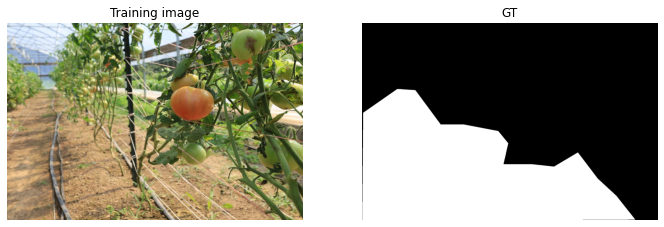

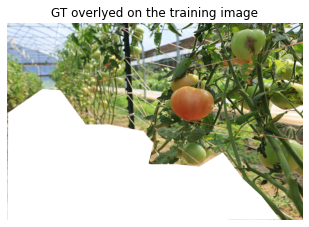

In [49]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
  
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



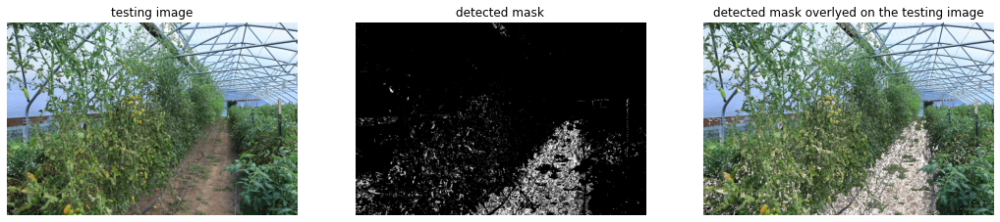

TP :  85599
FP :  556315
FN :  25328
TN :  1082358

Precision:  0.1333496387366532
Recall:  0.771669656621021
fscore:  0.22740259895515788


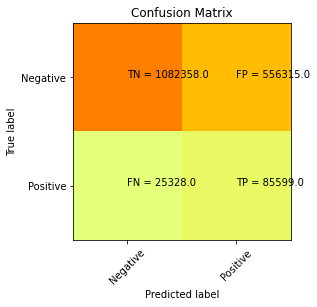

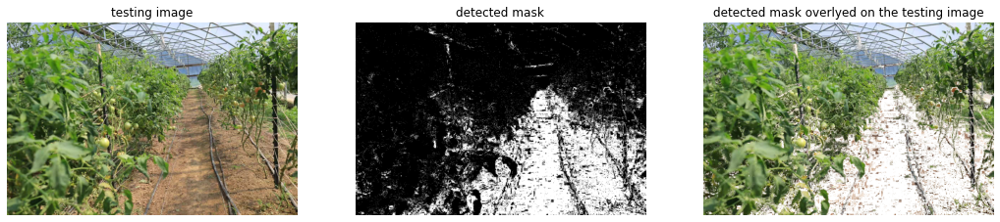

TP :  298839
FP :  984989
FN :  255822
TN :  1959550

Precision:  0.23277183547951907
Recall:  0.5387777399168141
fscore:  0.32509196410748176


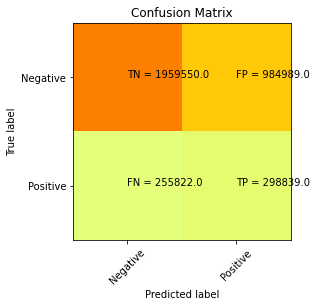

In [51]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()

#Case 2-c

In [52]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case2
trainingImages = [2]
testingImages = [1, 3]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

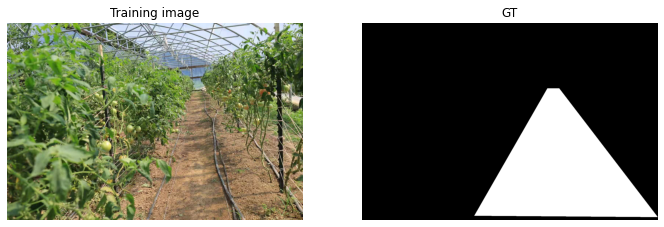

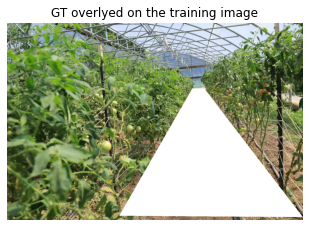

In [53]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    
    ### Likelihood-related codes:
    
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



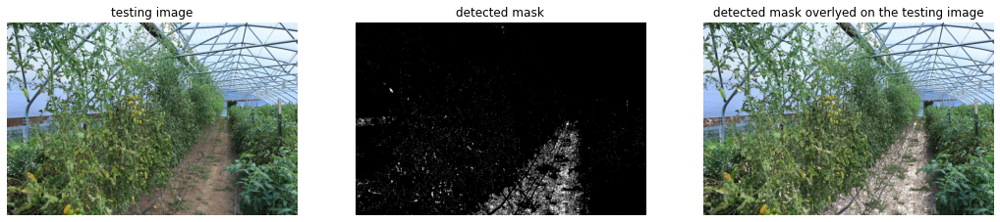

TP :  42872
FP :  332687
FN :  20013
TN :  1354028

Precision:  0.11415516603250088
Recall:  0.6817524051840661
fscore:  0.19556431380062217


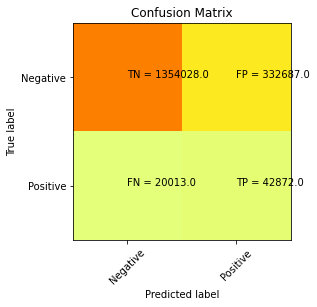

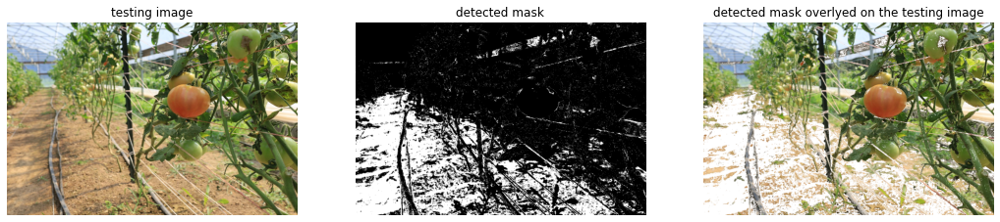

TP :  144295
FP :  606823
FN :  356527
TN :  2391555

Precision:  0.19210696588285728
Recall:  0.2881163367423955
fscore:  0.2305142418965765


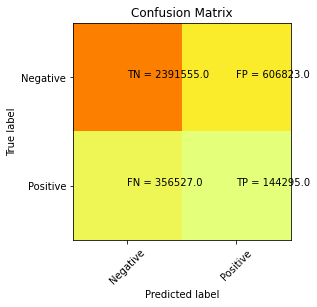

In [54]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()

#Case 3-c

In [55]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [1]
testingImages = [2, 3]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

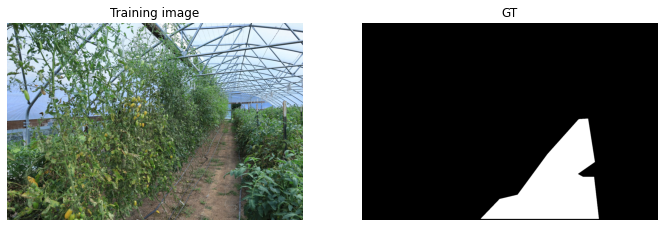

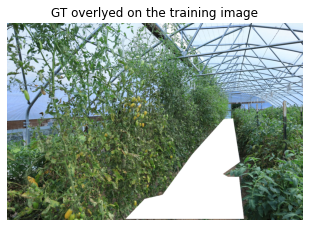

In [56]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



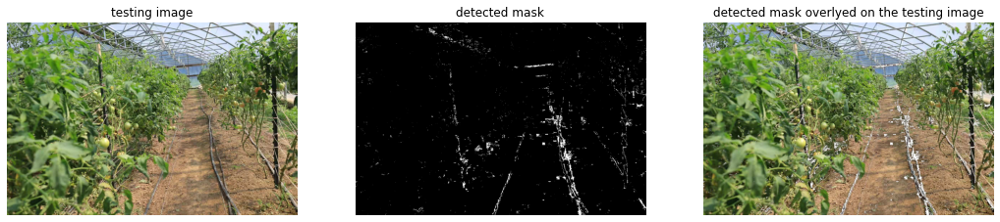

TP :  9802
FP :  167160
FN :  24032
TN :  1548606

Precision:  0.05539042280263559
Recall:  0.2897085771708932
fscore:  0.09299986717015504


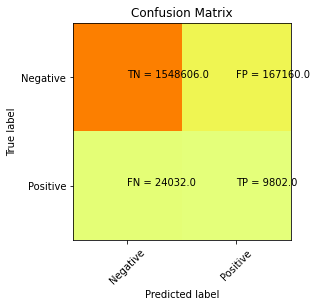

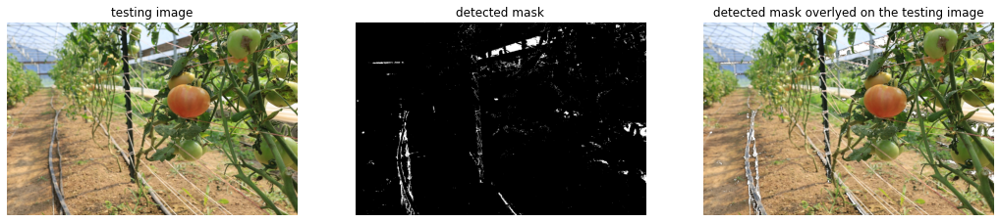

TP :  11025
FP :  342899
FN :  63599
TN :  3081677

Precision:  0.0311507555294357
Recall:  0.1477406732418525
fscore:  0.05145281275376387


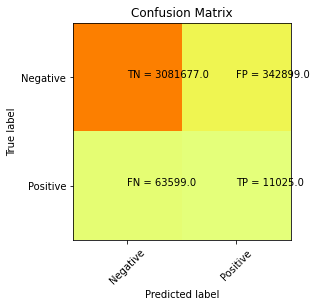

In [57]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives
    
    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()

##Part d
# 1. Increase the number of training data

#Case 1-d

In [58]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [2,3]
testingImages = [1]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

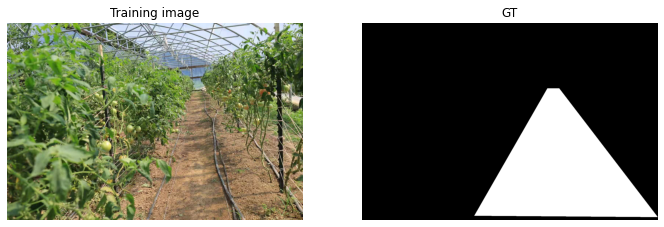

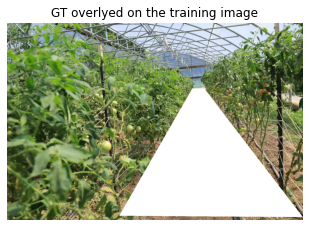

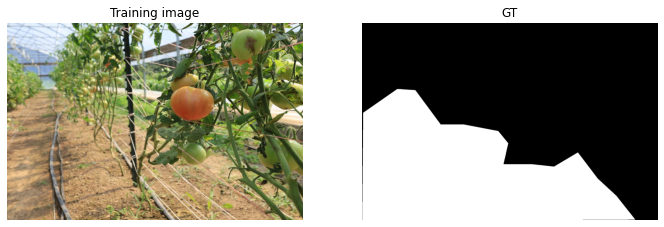

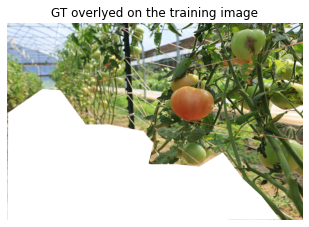

In [59]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



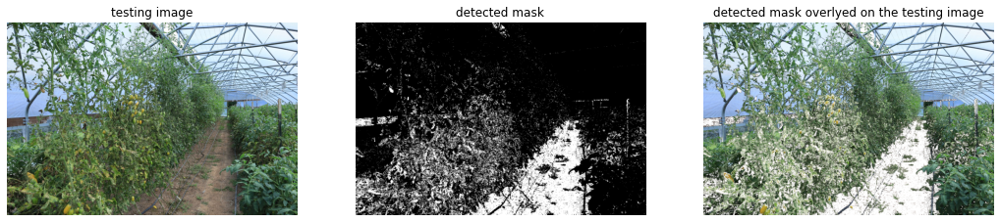

TP :  245349
FP :  396565
FN :  81380
TN :  1026306

Precision:  0.3822147515087691
Recall:  0.750925078581944
fscore:  0.5065829206425897


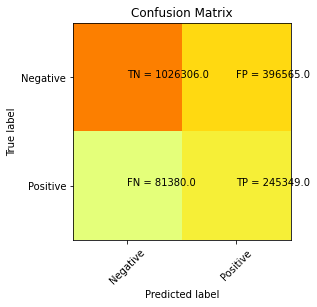

In [60]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    

#Case 2-d

In [61]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [1,3]
testingImages = [2]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

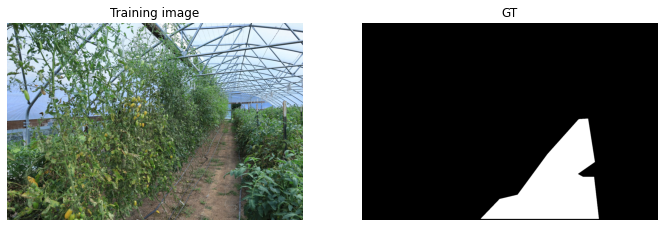

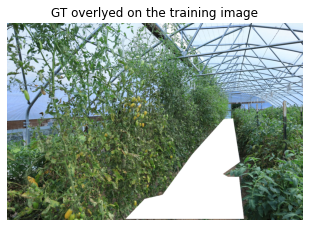

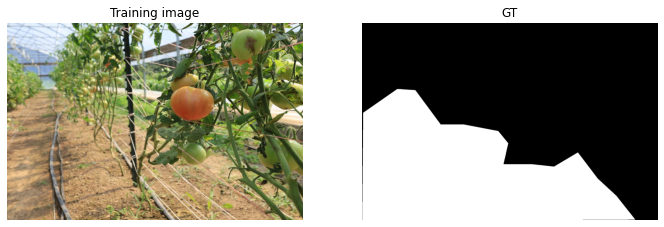

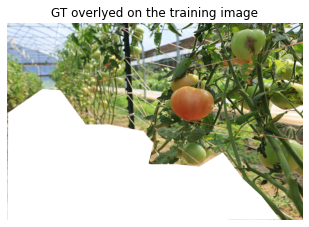

In [62]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



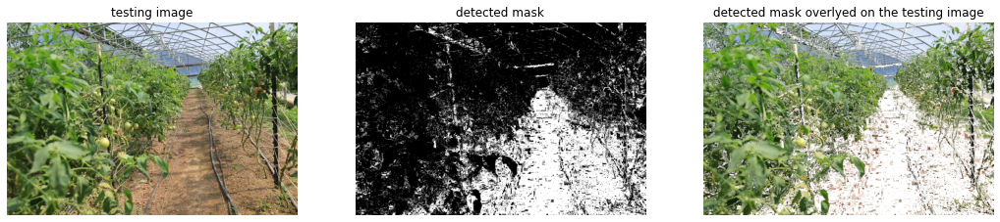

TP :  242649
FP :  399265
FN :  283363
TN :  824323

Precision:  0.378008580588677
Recall:  0.46129936199174165
fscore:  0.41552118884244377


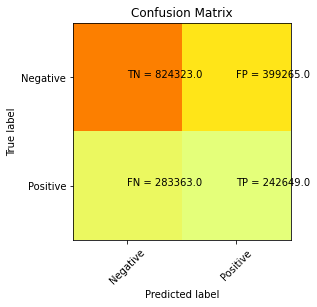

In [63]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    

#Case 3-d

In [64]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [1,2]
testingImages = [3]

### Parameters
nDim = 256 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

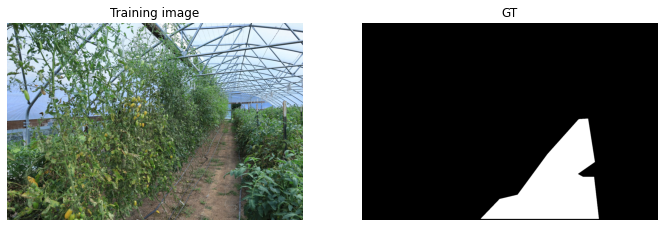

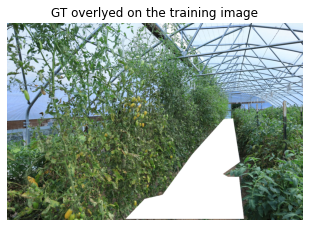

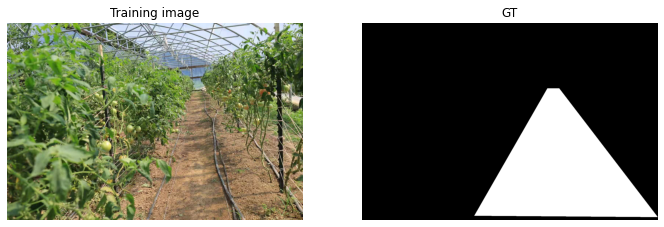

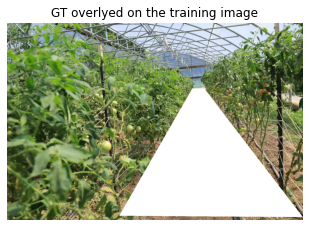

In [65]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



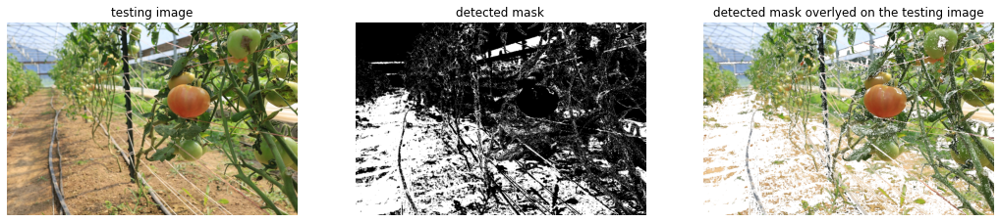

TP :  138498
FP :  237061
FN :  475568
TN :  898473

Precision:  0.368778274518784
Recall:  0.2255425312588549
fscore:  0.27989996210685864


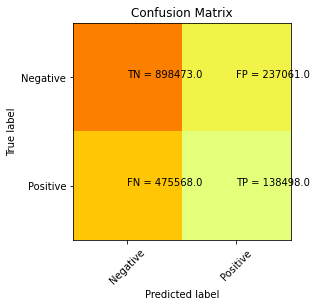

In [66]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0]
        g = origIm[i][j][1]
        b = origIm[i][j][2]
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    

#2. Change the nDim Parameter (part d)


# 1) nDim = 64

In [69]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [1,3]
testingImages = [2]

### Parameters
nDim = 64 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

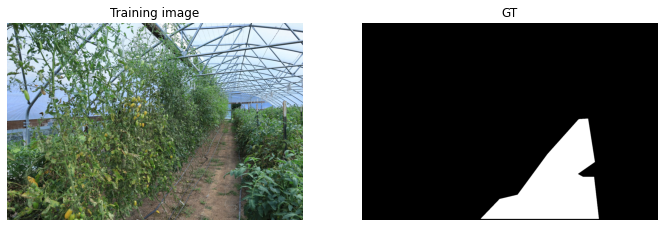

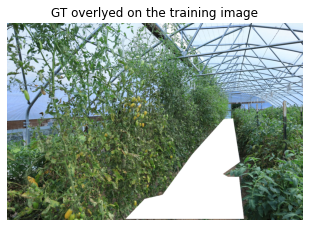

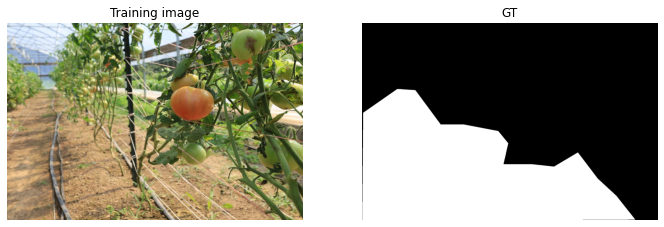

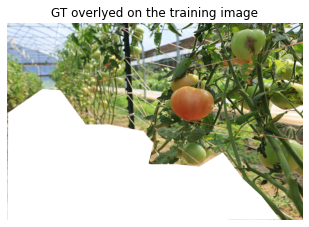

In [71]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0] //4
        g = origIm[i][j][1] //4
        b = origIm[i][j][2] //4

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



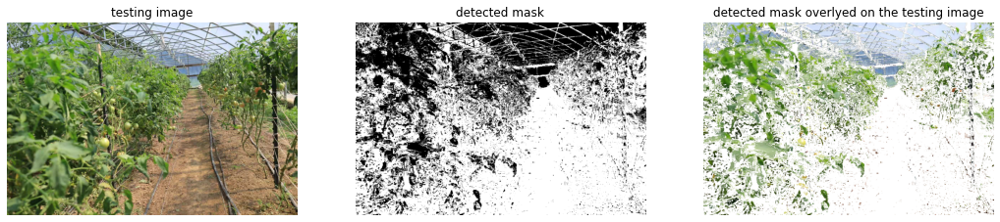

TP :  501864
FP :  140050
FN :  652222
TN :  455464

Precision:  0.7818243565337413
Recall:  0.4348584074323751
fscore:  0.5588685968819599


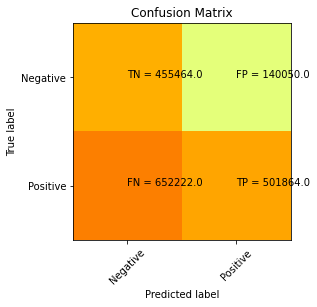

In [72]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0] //4
        g = origIm[i][j][1] //4
        b = origIm[i][j][2] //4
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    

# 2) nDim = 128

In [73]:
### File directory
# datadir = 'data-greenhouse/Tunnel-'
datadir = 'Tunnel-'

###Case3
trainingImages = [1,3]
testingImages = [2]

### Parameters
nDim = 128 #number of bins for the color likelihood distribution. This is too big. Try to have smaller bins such as 8, 16, 32, etc.

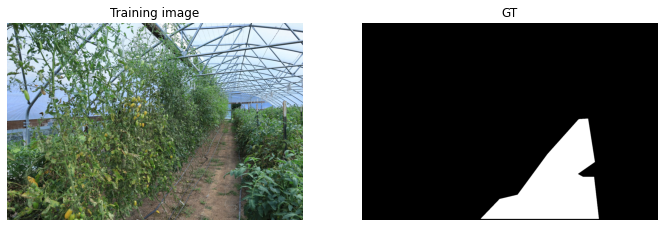

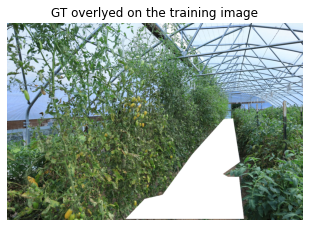

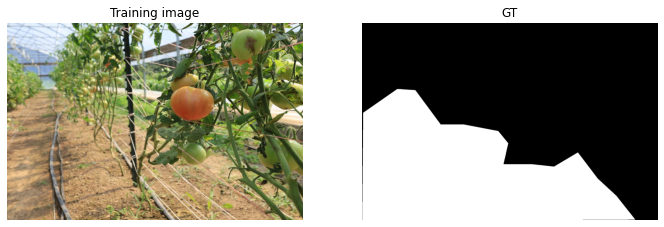

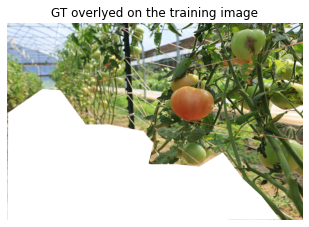

In [74]:
### Training process
Pr_x_given_y_equalsTo_1 = np.zeros((nDim,nDim,nDim)) #likelihood for the ground class
Pr_x_given_y_equalsTo_0 = np.zeros((nDim,nDim,nDim)) #likelihood for the non-ground class
N_GroundPixels = 0 #Pr_y_equalsTo_1 = N_GroundPixels/N_totalPixels
for iFile in trainingImages:
    ### Load the training image and labeled image regions
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')   
    labels = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE) #label=1 representing the ground class
    labels = cv2.threshold(labels, 127, 1, cv2.THRESH_BINARY)[1]
    
    ### Visualization input image and its labels
    nrows, ncols = origIm.shape[0], origIm.shape[1] #1080, 1620
    showIm = origIm.copy() 
    showIm[labels==1] = 255; #white

    
    ### Be sure to convert the color space of the image from BGR (Opencv) to RGB (Matplotlib) before you show a color image read from OpenCV
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('Training image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(labels, 'gray')
    plt.title('GT')
    plt.axis("off")
    
    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('GT overlyed on the training image')
    plt.axis("off")

    plt.show()
      
    ### Prior-related codes:
    
    ### Likelihood-related codes:
    
    # Fill in your code here
    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0] //2
        g = origIm[i][j][1] //2
        b = origIm[i][j][2] //2

        if(labels[i][j] ==1):
          Pr_x_given_y_equalsTo_1[r][g][b] = Pr_x_given_y_equalsTo_1[r][g][b] +1
          N_GroundPixels = N_GroundPixels +1
        else:
          Pr_x_given_y_equalsTo_0[r][g][b] = Pr_x_given_y_equalsTo_0[r][g][b] +1    

### Some other codes such as normalizing the likelihood/prior and computing Pr_y_equalsTo_0:

# Fill in your code here
    Pr_y_equalsTo_1 = N_GroundPixels/ (nrows * ncols)
    Pr_y_equalsTo_0 = 1- Pr_y_equalsTo_1



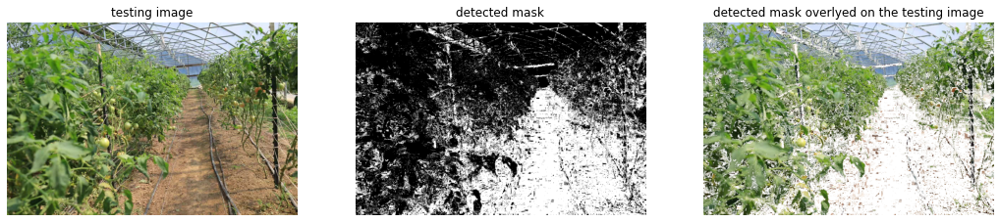

TP :  309545
FP :  332369
FN :  378070
TN :  729616

Precision:  0.4822219175777441
Recall:  0.4501719712339027
fscore:  0.4656461047483733


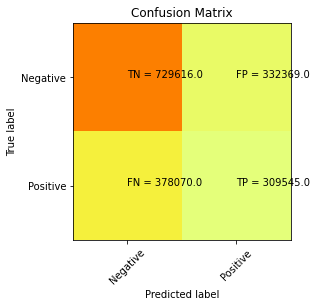

In [75]:
### Testing
truePositives = 0;
falsePositives = 0;
falseNegatives = 0;
trueNegatives = 0;
# testingImages = [3, 2]

for iFile in testingImages:  
    ### Load the testing image and ground truth regions  
    origIm = cv2.imread(datadir + '0' + str(iFile) + '.jpg')
    gtMask = cv2.imread(datadir + '0' + str(iFile) + '-label.png', cv2.IMREAD_GRAYSCALE)
    gtMask = cv2.threshold(gtMask, 127, 1, cv2.THRESH_BINARY)[1]
    nrows, ncols = origIm.shape[0], origIm.shape[1] 
    
    ### Define the posteriors
    Pr_y_equalsTo_1_given_x = np.zeros((nrows,ncols));   
    Pr_y_equalsTo_0_given_x = np.zeros((nrows,ncols));

    ### Codes to infer the posterior:
    
    detectedMask = np.zeros((nrows,ncols))

    for i in range(nrows):
      for j in range(ncols):
        r = origIm[i][j][0] //2
        g = origIm[i][j][1] //2
        b = origIm[i][j][2] //2
        Pr_y_equalsTo_1_given_x[i][j] = Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1
        if Pr_x_given_y_equalsTo_1[r][g][b] * Pr_y_equalsTo_1 > 0.5:
          detectedMask[i][j] = 1
    
    ### Codes to obtain the final classification result (detectedMask):
    
    
    ### Codes to calculate the TP, FP, FN:

    ### Visualize the classification results
    showIm = origIm.copy()
    showIm[detectedMask==1] = 255;

    plt.figure(figsize=(18, 6))
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(origIm, cv2.COLOR_BGR2RGB))
    plt.title('testing image')
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(detectedMask, 'gray')
    plt.title('detected mask')
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(cv2.cvtColor(showIm, cv2.COLOR_BGR2RGB))
    plt.title('detected mask overlyed on the testing image')
    plt.axis("off")
    plt.show()

### Codes to calculate the precision, recall, and fscore:

#detected = detected_mask
#GT = labels

    for i in range(nrows) :
      for j in range(ncols) :
        if (labels[i, j] == 1) and (detectedMask[i, j] == 1) :
          truePositives += 1;
        elif (labels[i, j] == 1) and (detectedMask[i, j] == 0) :
          falsePositives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 1) :
          falseNegatives += 1;
        elif (labels[i, j] == 0) and (detectedMask[i, j] == 0) :
          trueNegatives += 1;  
    print("TP : ",truePositives)
    print("FP : ",falsePositives)
    print("FN : ",falseNegatives)
    print("TN : ",trueNegatives)
    print()


    precision = truePositives/(truePositives+falsePositives)
    recall = truePositives/(truePositives+falseNegatives)
    print("Precision: ", precision)
    print("Recall: ", recall)
    print("fscore: ", (2 * precision * recall) / (precision + recall))

    cm = np.zeros((2, 2))
    cm[0][0] = trueNegatives
    cm[0][1] = falsePositives
    cm[1][0] = falseNegatives
    cm[1][1] = truePositives

    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Negative','Positive']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames, rotation=45)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    